# Get the data
Split the data into frames and run an object detection on it 
Clean the object detection and find the object

In [1]:
import os
import cv2
import numpy as np
import numpy as np
from PIL import Image
from matplotlib import cm


In [7]:
os.chdir("/Users/kunal/Documents/AAPersonalAIPROJECT/Cardetection/")
images_DIR = "/Users/kunal/Documents/AAPersonalAIPROJECT/Cardetection/LOGO/images/images/"

In [8]:
array = []
count = 0
for i in os.listdir(images_DIR):
    count+=1
    i = i[:-4]
    result = ''.join([num for num in i if not num.isdigit()])
    result = result[:-6]
    array.append(result)
array = set(array)

In [9]:
print(' '.join([str(item) for item in array]))
print("\nThe number of cars is:", len(array))

Saab Mercedes Kia Opel Nissan Alfa Romeo Skoda Land Rover Porsche Mazda Volvo Seat Mitsubishi Audi Volkswagen Toyota Renault Lancia Dodge BMW Jaguar Suzuki Citroen Jeep Peugeot Hyundai Lexus Maserati Fiat Honda Tesla Rover Daewoo Ferrari Subaru Chevrolet Dacia Ford Lada Tata

The number of cars is: 40


# Split the frames

In [10]:
DataDIRECTORY = "/Users/kunal/Documents/AAPersonalAIPROJECT/Cardetection/PersonalData/"

In [15]:
def extract_image_one_fps(video_source_path):
    vidcap = cv2.VideoCapture(video_source_path)
    count = 0
    success = True
    while success:
        vidcap.set(cv2.CAP_PROP_POS_MSEC,(count*1000)) # 2 second***   
        success,image = vidcap.read()
        ## Stop when last frame is identified
        image_last = cv2.imread("frame{}.png".format(count-1))
        if np.array_equal(image, image_last):
            break
        try:
            cv2.imwrite("frame%d.png" % count, image)     # save frame as PNG file
            print( '{}.sec reading a new frame:{}'.format(count,success))
            count += 1
        except Exception as error:
            print("Finished")

In [16]:
os.chdir(DataDIRECTORY)
extract_image_one_fps("/Users/kunal/Documents/AAPersonalAIPROJECT/Cardetection/PersonalData/testvid.mp4")

0.sec reading a new frame:True
1.sec reading a new frame:True
2.sec reading a new frame:True
3.sec reading a new frame:True
4.sec reading a new frame:True
5.sec reading a new frame:True
6.sec reading a new frame:True
7.sec reading a new frame:True
8.sec reading a new frame:True
9.sec reading a new frame:True
10.sec reading a new frame:True
11.sec reading a new frame:True
12.sec reading a new frame:True
13.sec reading a new frame:True
14.sec reading a new frame:True
15.sec reading a new frame:True
16.sec reading a new frame:True
Finished


## Rotate the Images

In [17]:
os.chdir(DataDIRECTORY)

In [18]:
def rotate_image(image,deg):
    if deg ==90:
        return np.rot90(image)
    if deg ==180:
        return np.rot90(image,2)
    if deg == 270:
        return np.rot90(image,-1)

In [20]:
os.stat('frame16.png').st_size

9279831

In [15]:
count = 0
for i in os.listdir(DataDIRECTORY):
    if i.endswith(".png"):
        if os.stat(i).st_size != 0:
            img = cv2.imread(i)
            myarray = rotate_image(img, 270)
            np.uint8(cm.gist_earth(myarray)*255)
            im = Image.fromarray(myarray)
            nameofFile = "Frame" + str(count) + ".png"
            cv2.imwrite(nameofFile, myarray)
            print("IMAGE: ", i, " Done")
            count+=1

IMAGE:  frame0.png  Done
IMAGE:  frame1.png  Done
IMAGE:  frame10.png  Done
IMAGE:  frame11.png  Done
IMAGE:  frame12.png  Done
IMAGE:  frame13.png  Done
IMAGE:  frame14.png  Done
IMAGE:  frame15.png  Done
IMAGE:  frame16.png  Done
IMAGE:  frame2.png  Done
IMAGE:  frame3.png  Done
IMAGE:  frame4.png  Done
IMAGE:  frame5.png  Done
IMAGE:  frame6.png  Done
IMAGE:  frame7.png  Done
IMAGE:  frame8.png  Done
IMAGE:  frame9.png  Done


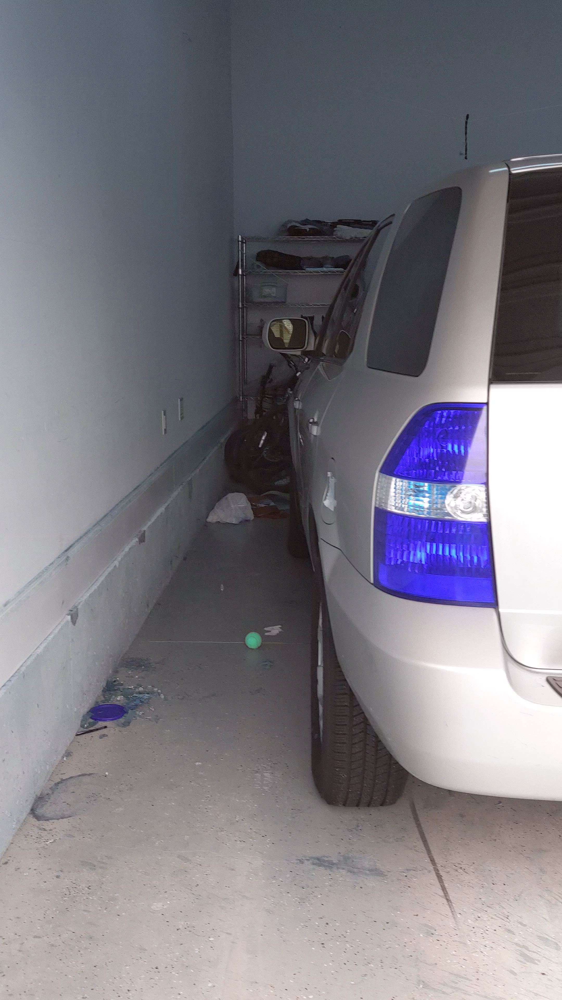

In [21]:
TestingIMG = cv2.imread("frame3.png")
IMAGETEST = Image.fromarray(TestingIMG)
IMAGETEST

# Lisence Plate Detection

In [17]:
import cv2 as cv
import argparse
import sys
import numpy as np
import os.path

# Initialize the parameters
confThreshold = 0.5  #Confidence threshold
nmsThreshold = 0.4  #Non-maximum suppression threshold

inpWidth = 416  #608     #Width of network's input image
inpHeight = 416 #608     #Height of network's input image

parser = argparse.ArgumentParser(description='Object Detection using YOLO in OPENCV')
parser.add_argument('--image', help='Path to image file.')
parser.add_argument('--video', help='Path to video file.')
args = parser.parse_args()

# Load names of classes
classesFile = "classes.names";

classes = None
with open(classesFile, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Give the configuration and weight files for the model and load the network using them.

modelConfiguration = "darknet-yolov3.cfg";
modelWeights = "lapi.weights";

net = cv.dnn.readNetFromDarknet(modelConfiguration, modelWeights)
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

# Get the names of the output layers
def getOutputsNames(net):
    # Get the names of all the layers in the network
    layersNames = net.getLayerNames()
    # Get the names of the output layers, i.e. the layers with unconnected outputs
    return [layersNames[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# Draw the predicted bounding box
def drawPred(classId, conf, left, top, right, bottom):
    # Draw a bounding box.
    #    cv.rectangle(frame, (left, top), (right, bottom), (255, 178, 50), 3)
    cv.rectangle(frame, (left, top), (right, bottom), (0, 255, 0), 3)

    label = '%.2f' % conf

    # Get the label for the class name and its confidence
    if classes:
        assert(classId < len(classes))
        label = '%s:%s' % (classes[classId], label)

    #Display the label at the top of the bounding box
    labelSize, baseLine = cv.getTextSize(label, cv.FONT_HERSHEY_SIMPLEX, 0.5, 1)
    top = max(top, labelSize[1])
    cv.rectangle(frame, (left, top - round(1.5*labelSize[1])), (left + round(1.5*labelSize[0]), top + baseLine), (0, 0, 255), cv.FILLED)
    #cv.rectangle(frame, (left, top - round(1.5*labelSize[1])), (left + round(1.5*labelSize[0]), top + baseLine),    (255, 255, 255), cv.FILLED)
    cv.putText(frame, label, (left, top), cv.FONT_HERSHEY_SIMPLEX, 0.75, (0,0,0), 2)

# Remove the bounding boxes with low confidence using non-maxima suppression
def postprocess(frame, outs):
    frameHeight = frame.shape[0]
    frameWidth = frame.shape[1]

    classIds = []
    confidences = []
    boxes = []
    # Scan through all the bounding boxes output from the network and keep only the
    # ones with high confidence scores. Assign the box's class label as the class with the highest score.
    classIds = []
    confidences = []
    boxes = []
    for out in outs:
        print("out.shape : ", out.shape)
        for detection in out:
            #if detection[4]>0.001:
            scores = detection[5:]
            classId = np.argmax(scores)
            #if scores[classId]>confThreshold:
            confidence = scores[classId]
            if detection[4]>confThreshold:
                print(detection[4], " - ", scores[classId], " - th : ", confThreshold)
                print(detection)
            if confidence > confThreshold:
                center_x = int(detection[0] * frameWidth)
                center_y = int(detection[1] * frameHeight)
                width = int(detection[2] * frameWidth)
                height = int(detection[3] * frameHeight)
                left = int(center_x - width / 2)
                top = int(center_y - height / 2)
                classIds.append(classId)
                confidences.append(float(confidence))
                boxes.append([left, top, width, height])

    # Perform non maximum suppression to eliminate redundant overlapping boxes with
    # lower confidences.
    indices = cv.dnn.NMSBoxes(boxes, confidences, confThreshold, nmsThreshold)
    for i in indices:
        i = i[0]
        box = boxes[i]
        left = box[0]
        top = box[1]
        width = box[2]
        height = box[3]
        drawPred(classIds[i], confidences[i], left, top, left + width, top + height)

# Process inputs
winName = 'Deep learning object detection in OpenCV'
cv.namedWindow(winName, cv.WINDOW_NORMAL)

outputFile = "yolo_out_py.avi"
if (args.image):
    # Open the image file
    if not os.path.isfile(args.image):
        print("Input image file ", args.image, " doesn't exist")
        sys.exit(1)
    cap = cv.VideoCapture(args.image)
    outputFile = args.image[:-4]+'_yolo_out_py.jpg'
elif (args.video):
    # Open the video file
    if not os.path.isfile(args.video):
        print("Input video file ", args.video, " doesn't exist")
        sys.exit(1)
    cap = cv.VideoCapture(args.video)
    outputFile = args.video[:-4]+'_yolo_out_py.avi'
else:
    # Webcam input
    cap = cv.VideoCapture(0)

# Get the video writer initialized to save the output video
if (not args.image):
    vid_writer = cv.VideoWriter(outputFile, cv.VideoWriter_fourcc('M','J','P','G'), 30, (round(cap.get(cv.CAP_PROP_FRAME_WIDTH)),round(cap.get(cv.CAP_PROP_FRAME_HEIGHT))))

while cv.waitKey(1) < 0:

    # get frame from the video
    hasFrame, frame = cap.read()

    # Stop the program if reached end of video
    if not hasFrame:
        print("Done processing !!!")
        print("Output file is stored as ", outputFile)
        cv.waitKey(3000)
        break

    # Create a 4D blob from a frame.
    blob = cv.dnn.blobFromImage(frame, 1/255, (inpWidth, inpHeight), [0,0,0], 1, crop=False)

    # Sets the input to the network
    net.setInput(blob)

    # Runs the forward pass to get output of the output layers
    outs = net.forward(getOutputsNames(net))

    # Remove the bounding boxes with low confidence
    postprocess(frame, outs)

    # Put efficiency information. The function getPerfProfile returns the overall time for inference(t) and the timings for each of the layers(in layersTimes)
    t, _ = net.getPerfProfile()
    label = 'Inference time: %.2f ms' % (t * 1000.0 / cv.getTickFrequency())
    #cv.putText(frame, label, (0, 15), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255))

    # Write the frame with the detection boxes
    if (args.image):
        cv.imwrite(outputFile, frame.astype(np.uint8));
    else:
        vid_writer.write(frame.astype(np.uint8))

usage: ipykernel_launcher.py [-h] [--image IMAGE] [--video VIDEO]
ipykernel_launcher.py: error: unrecognized arguments: -f C:\Users\kunal\AppData\Roaming\jupyter\runtime\kernel-64b343d8-00ed-4f80-82a8-a72dd9184c24.json


SystemExit: 2

C:\Users\kunal\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3334: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [129]:
import numpy as np
light_spots = np.array((img > 245).nonzero()).T

In [130]:
light_spots.shape

(296259, 3)

Text(0.5, 1.0, 'light spots in image')

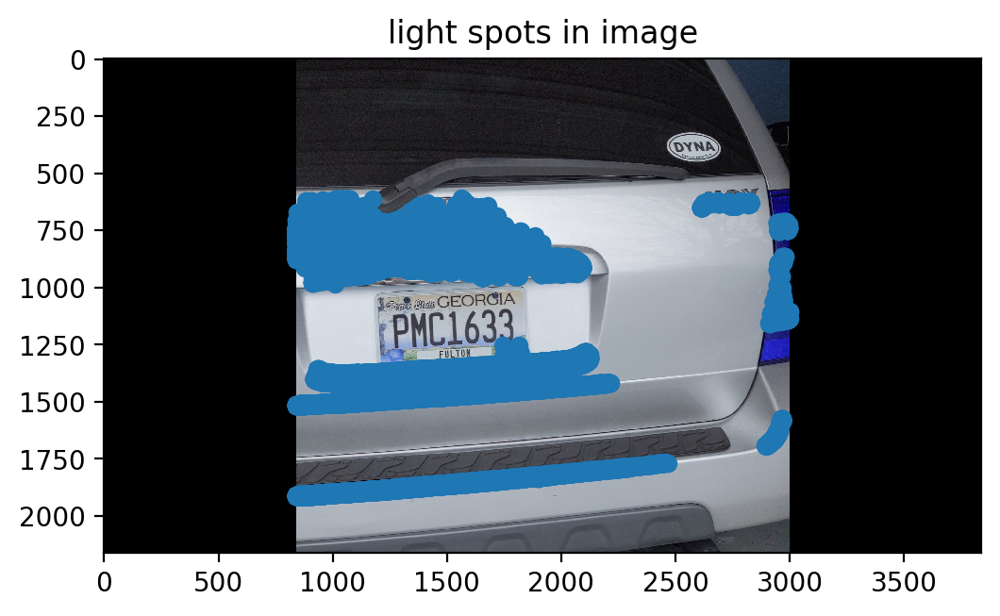

In [131]:
plt.plot(light_spots[:, 1], light_spots[:, 0], 'o')
plt.imshow(img)
plt.title('light spots in image')

In [132]:
dark_spots = np.array((img < 3).nonzero()).T
dark_spots.shape

(10900687, 3)

Text(0.5, 1.0, 'dark spots in image')

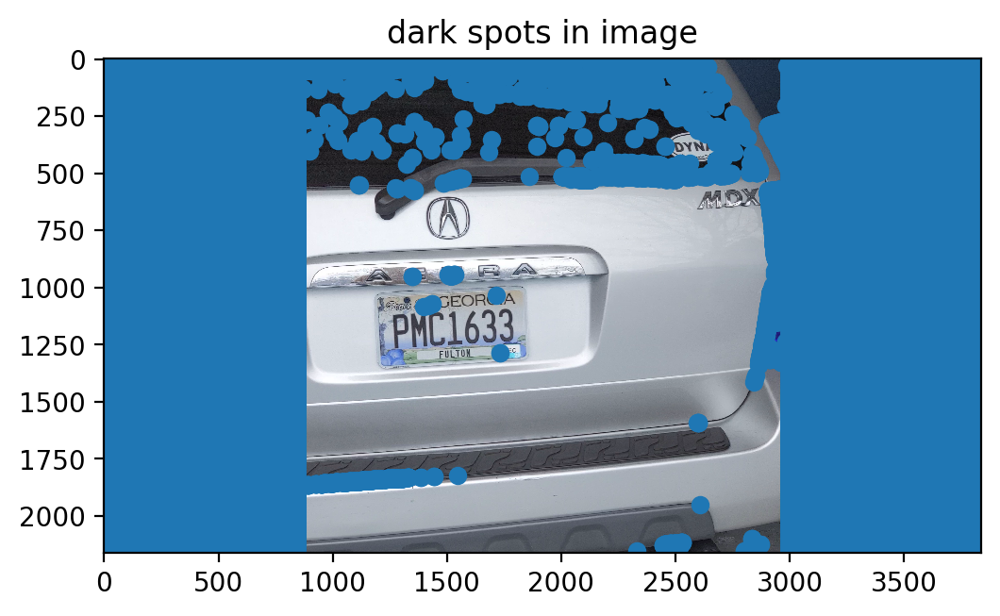

In [133]:
plt.plot(dark_spots[:, 1], dark_spots[:, 0], 'o')
plt.imshow(img)
plt.title('dark spots in image')

In [134]:
from scipy import ndimage as ndi
bool_mask = np.zeros(img.shape, dtype=np.bool)
bool_mask[tuple(light_spots.T)] = True
bool_mask[tuple(dark_spots.T)] = True
seed_mask, num_seeds = ndi.label(bool_mask)
num_seeds

2225

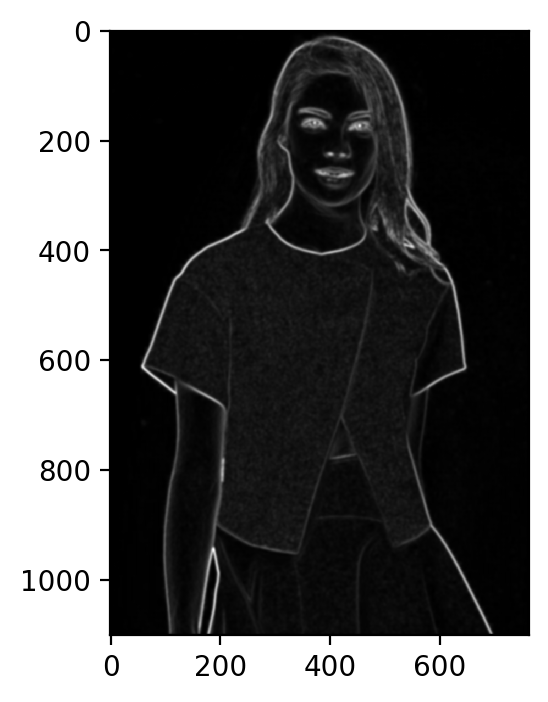

In [136]:
blurred = filters.gaussian(sobel, sigma=2.0)
plt.imshow(blurred)

# Lane Detection

In [1]:
import cv2

In [2]:
cap = cv2.VideoCapture(0)
while True:
    ret, img = cap.read()
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    canny = cv2.Canny(blur, 10, 70)
    ret, mask = cv2.threshold(canny, 70, 255, cv2.THRESH_BINARY)
    cv2.imshow('Video feed', mask)
    
    if cv2.waitKey(1) == 13: #enter to cancel
        break
        cap.release()
        cv2.destroyAllWindows()

In [3]:
cap.release()
cv2.destroyAllWindows()

In [4]:
cv2.destroyAllWindows()

In [ ]:
import cv2
import numpy as np

img = cv2.imread("lines.png")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 75, 150)

lines = cv2.HoughLinesP(edges, 1, np.pi/180, 30, maxLineGap=250)

for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

cv2.imshow("Edges", edges)
cv2.imshow("Image", img)
cv2.imwrite("1.3_lines_with_gap.jpg", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2
import numpy as np

video = cv2.VideoCapture("road_car_view.mp4")

while True:
    ret, orig_frame = video.read()
    if not ret:
        video = cv2.VideoCapture("road_car_view.mp4")
        continue

    frame = cv2.GaussianBlur(orig_frame, (5, 5), 0)
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    low_yellow = np.array([18, 94, 140])
    up_yellow = np.array([48, 255, 255])
    mask = cv2.inRange(hsv, low_yellow, up_yellow)
    edges = cv2.Canny(mask, 75, 150)

    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50, maxLineGap=50)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(frame, (x1, y1), (x2, y2), (0, 255, 0), 5)

    cv2.imshow("frame", frame)
    cv2.imshow("edges", edges)

    key = cv2.waitKey(1)
    if key == 27:
        break
video.release()
cv2.destroyAllWindows()